In [20]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

import warnings

warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', 60)

In [2]:
df = pd.read_csv(r'src/combined_data.csv')
df

,sk_id_curr,target,name_contract_type_app,code_gender,flag_own_car,cnt_children,amt_income_total,amt_goods_price,name_type_suite_app,name_income_type,...,nflag_last_appl_in_day,name_contract_status,days_decision,name_payment_type,name_client_type,name_portfolio,channel_type,sellerplace_area,name_yield_group,product_combination
0,100002,1,Cash loans,M,0,0,202500.0,351000.0,Unaccompanied,Working,...,1.0,Approved,606.0,Cash through the bank,New,POS,Stone,500.0,low_normal,POS other with interest
1,100003,0,Cash loans,F,0,0,270000.0,1129500.0,Family,State servant,...,1.0,Approved,746.0,Cash through the bank,Repeater,Cash,Credit and cash offices,-1.0,low_normal,Cash X-Sell: low
2,100003,0,Cash loans,F,0,0,270000.0,1129500.0,Family,State servant,...,1.0,Approved,828.0,Cash through the bank,Refreshed,POS,Stone,1400.0,middle,POS industry with interest
3,100003,0,Cash loans,F,0,0,270000.0,1129500.0,Family,State servant,...,1.0,Approved,2341.0,Cash through the bank,Refreshed,POS,Country-wide,200.0,middle,POS household with interest
4,100004,0,Revolving loans,M,1,0,67500.0,135000.0,Unaccompanied,Working,...,1.0,Approved,815.0,Cash through the bank,New,POS,Regional / Local,30.0,middle,POS mobile without interest
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1403312,456255,0,Cash loans,F,0,0,157500.0,675000.0,Unaccompanied,Commercial associate,...,1.0,Approved,648.0,Cash through the bank,Repeater,Cash,Credit and cash offices,-1.0,middle,Cash X-Sell: middle
1403313,456255,0,Cash loans,F,0,0,157500.0,675000.0,Unaccompanied,Commercial associate,...,1.0,Refused,456.0,Cash through the bank,Repeater,Cards,Country-wide,20.0,high,Card Street
1403314,456255,0,Cash loans,F,0,0,157500.0,675000.0,Unaccompanied,Commercial associate,...,1.0,Refused,171.0,Cash through the bank,Repeater,Cash,Credit and cash offices,-1.0,low_normal,Cash Street: low
1403315,456255,0,Cash loans,F,0,0,157500.0,675000.0,Unaccompanied,Commercial associate,...,1.0,Approved,787.0,Cash through the bank,Repeater,Cash,AP+ (Cash loan),6.0,low_normal,Cash X-Sell: low


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1403317 entries, 0 to 1403316
Data columns (total 54 columns):
 #   Column                           Non-Null Count    Dtype  
---  ------                           --------------    -----  
 0   sk_id_curr                       1403317 non-null  int64  
 1   target                           1403317 non-null  int64  
 2   name_contract_type_app           1403317 non-null  object 
 3   code_gender                      1403317 non-null  object 
 4   flag_own_car                     1403317 non-null  int64  
 5   cnt_children                     1403317 non-null  int64  
 6   amt_income_total                 1403317 non-null  float64
 7   amt_goods_price                  1403317 non-null  float64
 8   name_type_suite_app              1403317 non-null  object 
 9   name_income_type                 1403317 non-null  object 
 10  name_education_type              1403317 non-null  object 
 11  name_family_status               1403317 non-null 

In [4]:
df.isna().sum()

sk_id_curr                         0
target                             0
name_contract_type_app             0
code_gender                        0
flag_own_car                       0
cnt_children                       0
amt_income_total                   0
amt_goods_price                    0
name_type_suite_app                0
name_income_type                   0
name_education_type                0
name_family_status                 0
name_housing_type                  0
region_population_relative         0
days_employed                      0
days_registration                  0
days_id_publish                    0
occupation_type                    0
region_rating_client_w_city        0
weekday_appr_process_start_app     0
hour_appr_process_start_app        0
reg_region_not_live_region         0
reg_region_not_work_region         0
live_region_not_work_region        0
reg_city_not_live_city             0
reg_city_not_work_city             0
organization_type                  0
e

In [5]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
sk_id_curr,1403317.0,278439.767285,102802.479905,1.000020e+05,189332.000000,278941.000000,367484.000000,4.562550e+05
target,1403317.0,0.086615,0.281271,0.000000e+00,0.000000,0.000000,0.000000,1.000000e+00
flag_own_car,1403317.0,0.337217,0.472760,0.000000e+00,0.000000,0.000000,1.000000,1.000000e+00
cnt_children,1403317.0,0.404579,0.717167,0.000000e+00,0.000000,0.000000,1.000000,1.900000e+01
amt_income_total,1403317.0,173372.284298,199164.797172,2.565000e+04,112500.000000,157500.000000,207000.000000,1.170000e+08
amt_goods_price,1403317.0,528279.342566,353528.120111,4.050000e+04,238500.000000,450000.000000,679500.000000,4.050000e+06
region_population_relative,1403317.0,0.020737,0.013341,2.900000e-04,0.010032,0.018850,0.028663,7.250800e-02
days_employed,1403317.0,72670.594293,143341.587554,0.000000e+00,1042.000000,2402.000000,6318.000000,3.652430e+05
days_registration,1403317.0,5002.552379,3549.921386,0.000000e+00,2001.000000,4508.000000,7508.000000,2.467200e+04
days_id_publish,1403317.0,3035.001788,1507.310047,0.000000e+00,1783.000000,3330.000000,4319.000000,7.197000e+03


In [6]:
df.target.value_counts()

target
0    1281768
1     121549
Name: count, dtype: int64

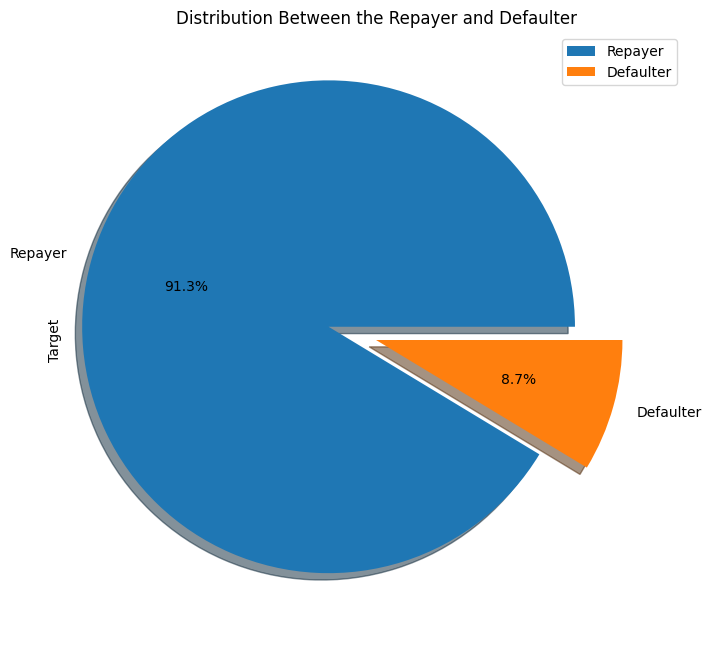

In [7]:
# Distribution Between the Repayer and Defaulter
plt.figure(figsize = (8, 8))
plt.pie(x =df.target.value_counts(), labels = ['Repayer', 'Defaulter'], explode = [0.2, 0], shadow = True, autopct='%1.1f%%' )
plt.legend()
plt.title('Distribution Between the Repayer and Defaulter')
plt.ylabel('Target')
plt.show()

8.7% of total clients are defaulter and have difficulties in repaying loans.

In [8]:
df.code_gender.value_counts()

code_gender
F    947948
M    455369
Name: count, dtype: int64

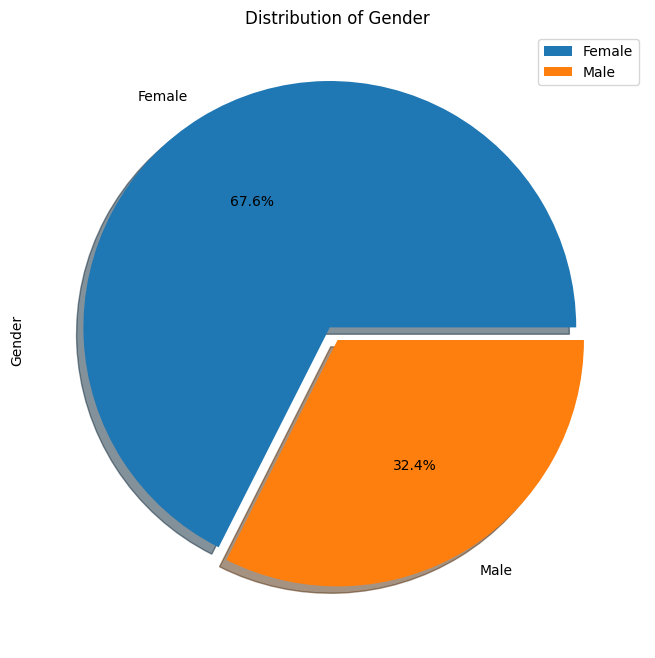

In [9]:
plt.figure(figsize = (8, 8))
plt.pie(x =df.code_gender.value_counts(), labels = ['Female', 'Male'], explode = [0.06, 0], shadow = True, autopct='%1.1f%%' )
plt.legend()
plt.title('Distribution of Gender')
plt.ylabel('Gender')
plt.show()

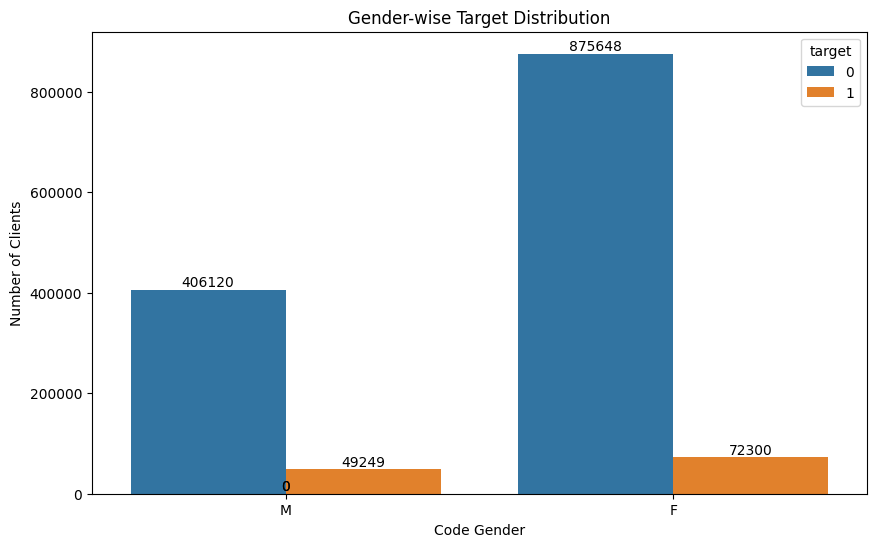

In [70]:
# Create the count plot
plt.figure(figsize=(10, 6))
ax = sns.countplot(data=df, x='code_gender', hue='target')

# Add text labels
counts = df.groupby(['code_gender', 'target']).size().unstack(fill_value=0)
for p in ax.patches:
    x = p.get_x() + p.get_width() / 2
    y = p.get_height()
    value = int(y)
    ax.annotate(value, (x, y), ha='center', va='center', fontsize=10, color='black', xytext=(0, 5), textcoords='offset points')

# Set labels and title
plt.xlabel('Code Gender')
plt.ylabel('Number of Clients')
plt.title('Gender-wise Target Distribution')

# Show the plot
plt.show()



- **Female Applicants**: Out of the total female applicants, 92.38% are repayers, and 7.62% are defaulters.
- **Male Applicants**: Out of the total male applicants, 89.19% are repayers, and 10.81% are defaulters.

This comparison indicates that a higher percentage of female applicants are repayers compared to male applicants, suggesting better repayment behavior among female applicants.

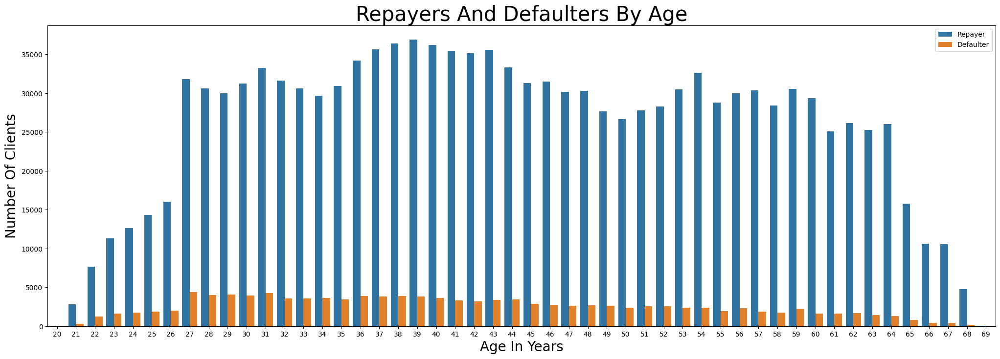

In [59]:
plt.figure(figsize=(25,8))
sns.countplot(x='age',data=df, hue ="target")
plt.title("Repayers And Defaulters By Age", fontsize=30)

plt.xlabel("Age In Years", fontsize=20)
plt.ylabel("Number Of Clients", fontsize=20)

plt.legend(labels=["Repayer","Defaulter"],
           loc="upper right")

plt.show()

Clients are mostly between the age of 27-64 and the clients who are 27 years old have the highest payment difficulty and the difficulty in payment gradually decreases as the age increases. So as the clients get older they have manage to pay the loan easier.

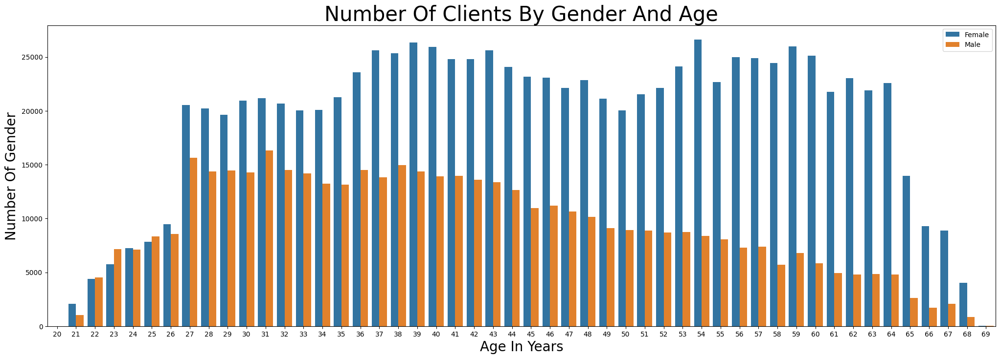

In [60]:
plt.figure(figsize=(25,8))
sns.countplot(x='age',data=df, hue ="code_gender")

plt.title("Number Of Clients By Gender And Age", fontsize=30)

plt.xlabel("Age In Years", fontsize=20)
plt.ylabel("Number Of Gender", fontsize=20)

plt.legend(labels=["Female","Male"], loc="upper right")

plt.show()

Under the age of 27, number of female and male clients are approximately equal, but clients older than 27 years old, are mostly female clients. The number of female clients doubles the number of male clients after the age of 43 and even nearly triple the number of male clients after the age of 54.

In [62]:
fig = px.histogram(df, x="cnt_children", color="code_gender")

fig.update_layout(
    title="Distribution Of Number Of Children For Each Gender",
    xaxis_title="Number Of Children",
    yaxis_title="Frequency",
    legend_title="Gender",
    font=dict(
        family="Helvetica",
        size=13,
        color="Black"))

fig.show()

Most of the clients have no children. Female clients with 1 or more children are more than male clients with 1 or more children.

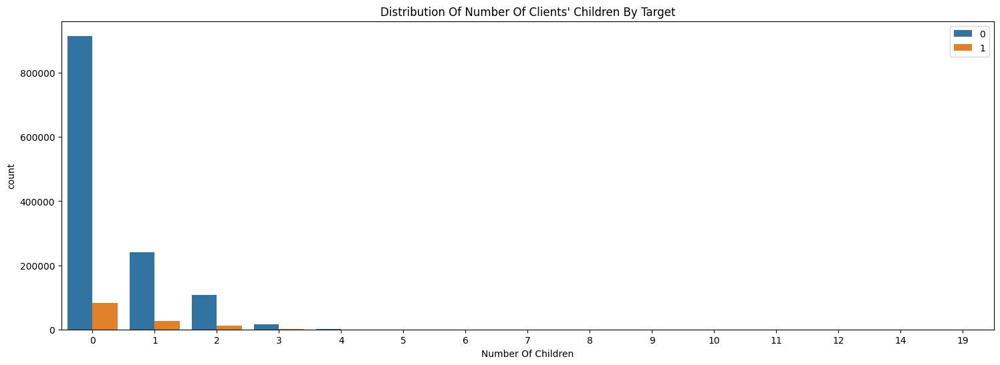

In [64]:
plt.figure(figsize=(18,6))
sns.countplot(x=df["cnt_children"],hue=df["target"])
plt.legend(loc="upper right")
plt.title("Distribution Of Number Of Clients' Children By Target")
plt.xlabel("Number Of Children")
plt.show()

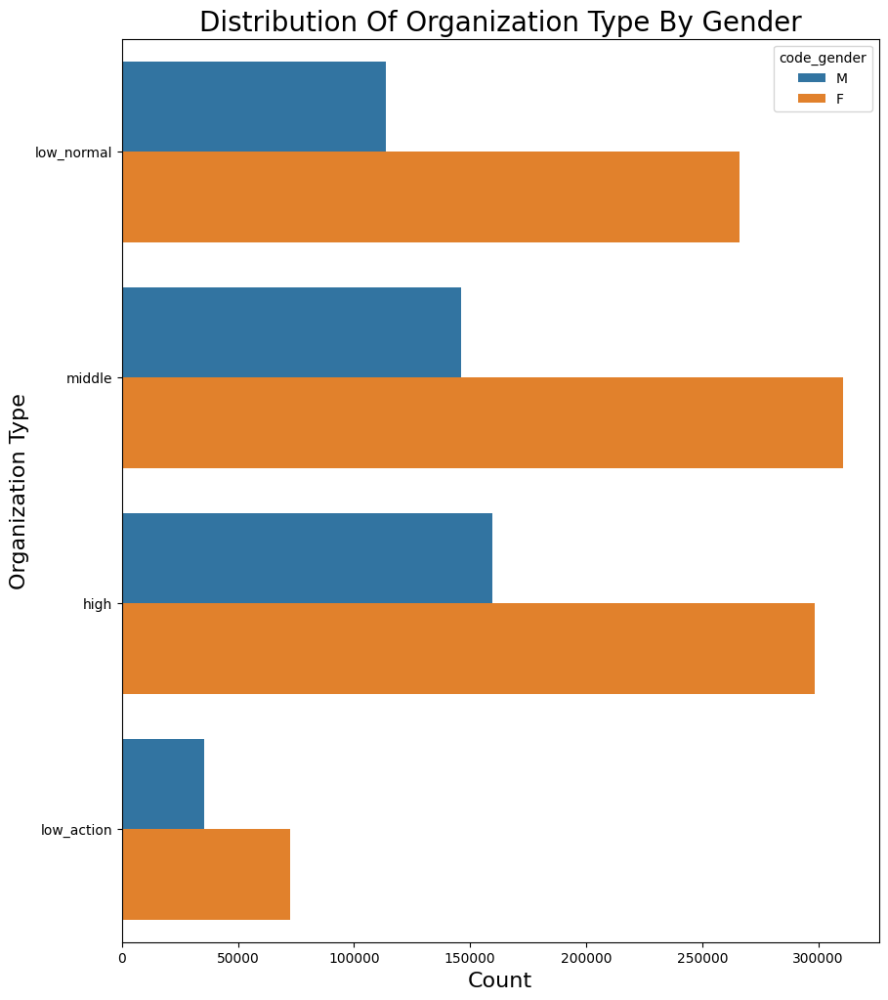

In [69]:
plt.figure(figsize=(10,12))
sns.countplot(data=df, y="name_yield_group", hue="code_gender", linewidth=0, legend= True)
plt.title("Distribution Of Organization Type By Gender", fontsize=20)
plt.ylabel("Organization Type", fontsize=16)
plt.xlabel("Count", fontsize=16)
plt.show()